# **Sales Opportunity Analysis at Sweet Lift Taxi Company**

# Project Goals

Sweet Lift a taxi company, has collected historical data about taxi orders at airports. In order to attract more drivers during peak hours, it is necessary to predict the number of taxi orders for the next hour. Create a model for such predictions.

The RMSE metric on *test set* cannot be more than 48.

## **1. Project Instructions**

1. Download the dataset and perform *resampling* in an hour.
2. Analyze the data.
3. Train different models with different hyperparameters. The test sample must be 10% of the initial *dataset*.
4. Test the data using a test sample and provide a conclusion.

## **2. Data Descriptions**

The data is stored in the `taxi.csv` file. Number of orders were stored in `num_orders` column.

In [ ]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

from statsmodels.tools.eval_measures import rmse # RMSE using statsmodels
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from datetime import datetime
import xgboost as xgb

from statsmodels.tsa.seasonal import seasonal_decompose

## **3. Data Preparation**

**Load Dataset**

In [ ]:
# The dataset for prophet must use 2 columns named ds for datetime (date), and y for num_orders (value)
df = pd.read_csv('/content/sample_data/taxi.csv')
print(df.shape)
df.head()

(26496, 2)


,datetime,num_orders
0,2018-03-01 00:00:00,9
1,2018-03-01 00:10:00,14
2,2018-03-01 00:20:00,28
3,2018-03-01 00:30:00,20
4,2018-03-01 00:40:00,32


**Create a dataframe to perform a predictive analysis**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   datetime    26496 non-null  object
 1   num_orders  26496 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 414.1+ KB


In [ ]:
# Change the datatype of datetime column to ds, and change the num_orders column to y
df['datetime'] = pd.to_datetime(df['datetime'])
df['datetime'] = df.rename(columns={"datetime": "ds"}, inplace=True)
df['num_orders'] = df.rename(columns={"num_orders": "y"}, inplace=True)
df.dtypes

ds            datetime64[ns]
y                      int64
datetime              object
num_orders            object
dtype: object

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   ds          26496 non-null  datetime64[ns]
 1   y           26496 non-null  int64         
 2   datetime    0 non-null      object        
 3   num_orders  0 non-null      object        
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 828.1+ KB


In [ ]:
# Drop the datetime and num_orders columns because it's already have no data
df = df.drop(['datetime', 'num_orders'], axis=1)

**Conclusion**

At data preparation stage we have a `taxi.csv` dataset. And then, we check the dataset `taxi.csv` it contains information about "Sweet Lift" a taxi company, this dataset has 2 columns and 26496 rows data. In this case we perform an analysis using machine learning models to help "Sweet Lift" a taxi company find solutions to encounter their problems. After we check the dataset, next we analyze the data, to check the columns that we actually use for the machine learning model furthermore. At this time we are using the Prophet model, therefore we need to change the `datetime` column to `ds`, and the `num_orders` column to `y`.

## **4. Data Analysis**

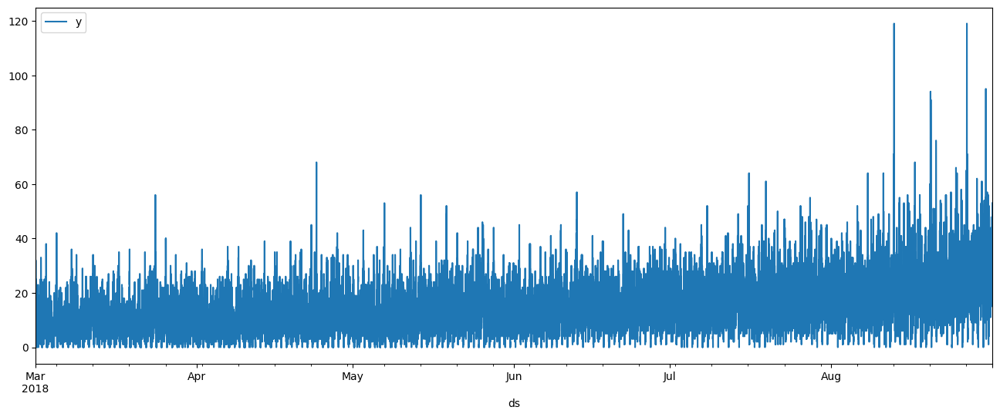

In [ ]:
# Check data pattern
df.plot(x='ds', y='y', figsize=(16,6))
plt.show()

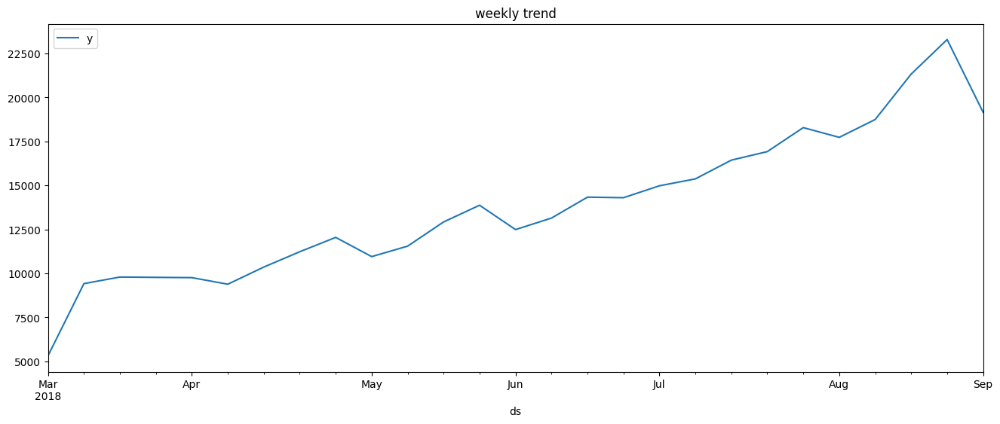

In [ ]:
# Check data pattern weekly
weekly = df.set_index('ds').resample('W').sum()
weekly.plot(figsize=(16,6))
plt.title('weekly trend')
plt.show()

**Conclusion**

After we carry out the plot above, it appears that some of the trends that we can analyze as follows:

1. In Q4 March 2018, there was 1 date with an increase in the number of taxi orders which almost reached 60 orders per day.
2. In Q4 April 2018, there was also 1 date with an increase in the number of taxi orders which even exceeded 60 orders per day.
3. In Q1 and Q2 May 2018, there was an increase in the number of taxi orders on 3 different dates with almost 60 orders per day.
4. In Q2 Jun 2018, there was 1 date with an increase in the number of taxi orders which even exceeded 60 orders per day.
5. In Q2 Jul 2018, there were several dates with an increase in the number of taxi orders which even exceeded 60 orders per day.
6. In Aug 2018, there were several dates with an increase in the number of taxi orders whose numbers increased significantly, even exceeding 100 orders per day.

For a while, we can conclude that the pattern of the Sweet Lift taxi company continues to experience an increase in orders every month, there has been a significant upward trend in Aug 2018. However, it is still unknown what are the main factors for the increase in the number of orders.To figure it out, we need to analyze furthermore.

# **4. Exploratory Data Analysis**

**Daily Pattern**

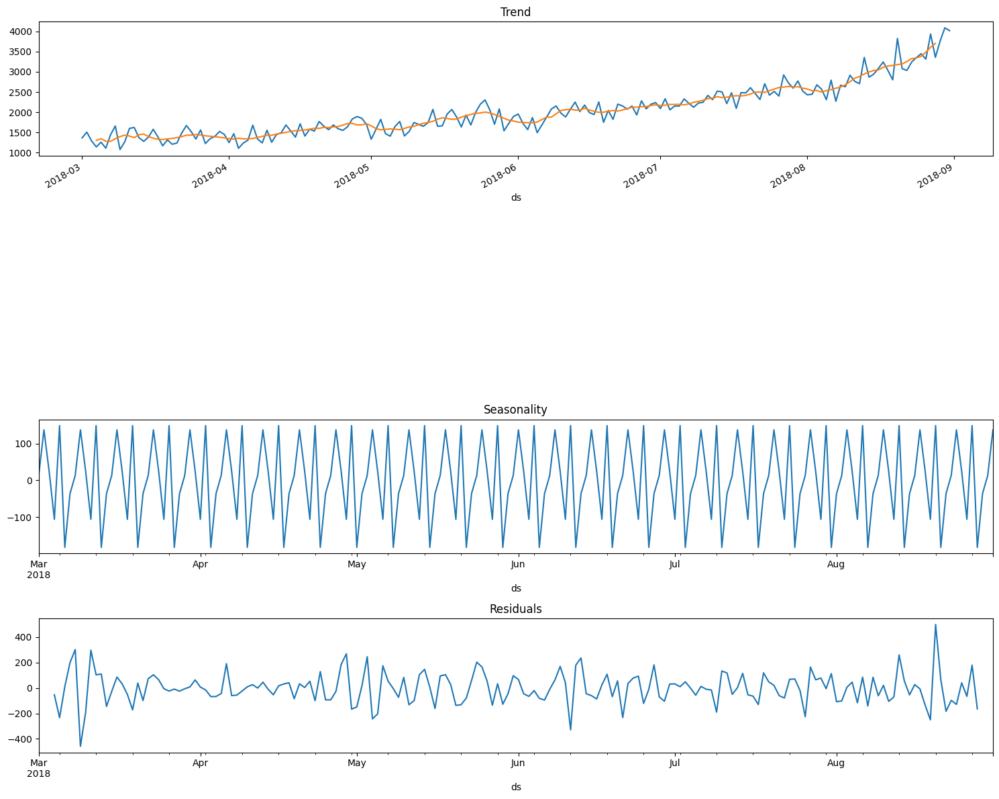

In [ ]:
decomposed = seasonal_decompose(df.set_index('ds').resample('D').sum())

plt.figure(figsize=(15, 12))
plt.subplot(411)
#Show Real daily data
plt.plot(df.set_index('ds').resample('D').sum())
plt.title('Real Data')

plt.subplot(411)
#Show Trend daily data
decomposed.trend.plot(ax=plt.gca())
plt.title('Trend')

plt.subplot(413)
#Show Seasonality daily data
decomposed.seasonal.plot(ax=plt.gca())
plt.title('Seasonality')

plt.subplot(414)
#Show Residual daily data
decomposed.resid.plot(ax=plt.gca())
plt.title('Residuals')

plt.tight_layout()



**Conclusion**

After we create a daily visualization, it can be seen that in the 'Trend' plot the pattern rises periodically starting from the **June 2018** period. However, it significantly increased in the **Aug 2018** period. This could possibly be caused by many things, such as certain events such as school holidays, or other events that caused an increase in the number of taxi orders at that time.

In the `Seasonality` plot, the graph is not really visible, because the movement is quite stable. However, on the 'Residuals' plot, we can see a sharp decline in Q1 **Mar 2018** which was preceded by a sharp increments on the previous day, it could possibly due to a one time event that occurred at the time, such as concert or festival held the day before. Then in Q3 **Aug 2018** there was a sharp increment, this might have been caused by a certain event at that time, or it could have been due to natural cause such as autumn in example, because the temperature was starting to get a bit colder, so people preferred to order taxi instead of walking or using another transportation.

## **5. Train The Models**

**Train Test Split**

In [ ]:
train = df.iloc[:len(df)-100]
test = df.iloc[len(df)-100:]

In [ ]:
# Extract additional features from the timestamp
df['hour'] = df['ds'].dt.hour
df['day_of_week'] = df['ds'].dt.dayofweek
df['month'] = df['ds'].dt.month

In [ ]:
# Set 'ds' column as index
df.set_index('ds', inplace=True)

In [ ]:
# Resample data for one hour
df_resampled = df.resample('1H').sum()

In [ ]:
df_resampled

,y,hour,day_of_week,month
ds,,,,
2018-03-01 00:00:00,124,0,18,18
2018-03-01 01:00:00,85,6,18,18
2018-03-01 02:00:00,71,12,18,18
2018-03-01 03:00:00,66,18,18,18
2018-03-01 04:00:00,43,24,18,18
...,...,...,...,...
2018-08-31 19:00:00,136,114,24,48
2018-08-31 20:00:00,154,120,24,48
2018-08-31 21:00:00,159,126,24,48


In [ ]:
# Split dataset to become features (X) dan target (y)
X = df_resampled[['hour', 'day_of_week', 'month']]
y = df_resampled['y']

In [ ]:
X

,hour,day_of_week,month
ds,,,
2018-03-01 00:00:00,0,18,18
2018-03-01 01:00:00,6,18,18
2018-03-01 02:00:00,12,18,18
2018-03-01 03:00:00,18,18,18
2018-03-01 04:00:00,24,18,18
...,...,...,...
2018-08-31 19:00:00,114,24,48
2018-08-31 20:00:00,120,24,48
2018-08-31 21:00:00,126,24,48


In [ ]:
y

ds
2018-03-01 00:00:00    124
2018-03-01 01:00:00     85
2018-03-01 02:00:00     71
2018-03-01 03:00:00     66
2018-03-01 04:00:00     43
                      ... 
2018-08-31 19:00:00    136
2018-08-31 20:00:00    154
2018-08-31 21:00:00    159
2018-08-31 22:00:00    223
2018-08-31 23:00:00    205
Freq: H, Name: y, Length: 4416, dtype: int64

In [ ]:
# Train test split using at least 10% data from the original dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [ ]:
print("Train set shape:", X_train.shape, y_train.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Train set shape: (3974, 3) (3974,)
Test set shape: (442, 3) (442,)


**Data Train Visualization**

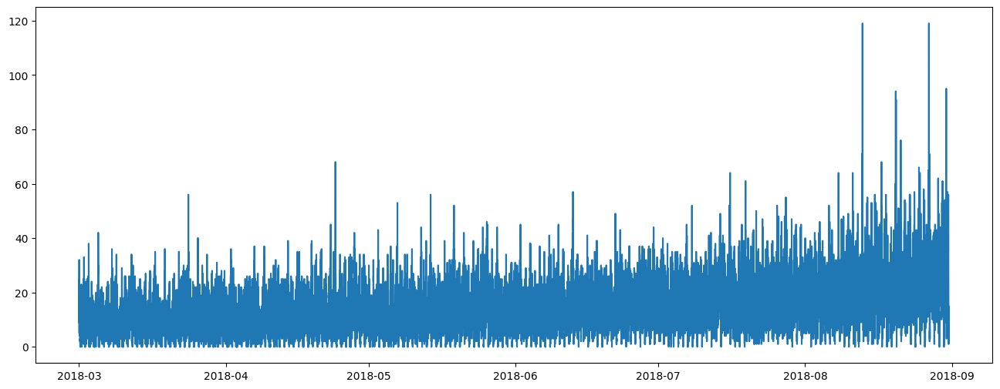

In [ ]:
plt.figure(figsize=(16, 6))
plt.plot(train['ds'], train['y'])
plt.show()

**Data Test Visualization**

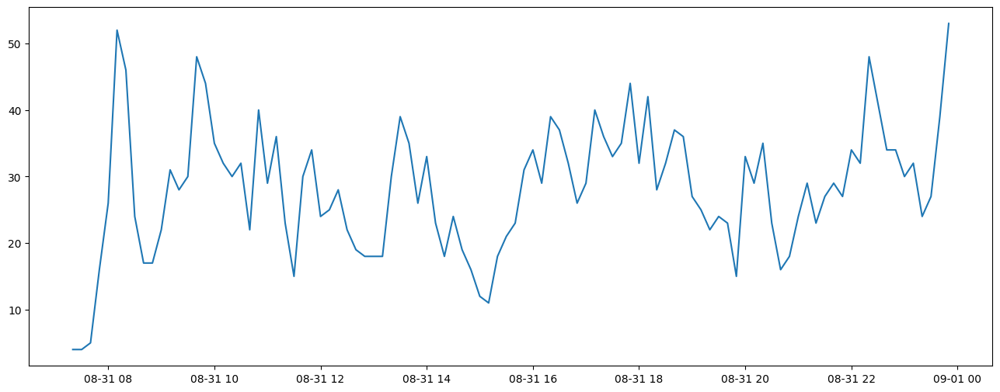

In [ ]:
plt.figure(figsize=(16, 6))
plt.plot(test['ds'], test['y'])
plt.show()

**Train Using XGBRegressor**

In [ ]:
# Create XGBRegressor model
modelRF = xgb.XGBRegressor()

In [ ]:
# Create hyperparameter grid for tuning hyperparameters
param_dist = {
    'n_estimators': [800, 1000, 1200],
    'learning_rate': [0.01, 0.001, 0.0001],
    'max_depth': [5, 7, 10],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'min_child_weight': [1, 3, 5],
}

In [ ]:
# Perform a random search with cross-validation to find the best parameters
random_search = RandomizedSearchCV(estimator=modelRF, param_distributions=param_dist, cv=10, scoring='neg_mean_squared_error', n_iter=100, random_state=42, error_score='raise')
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=10, error_score='raise',
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraint...
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_iter=100,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0, 0.1, 0.2],
                                        'learning_rate': [0.01, 0.001, 0.0001],
                                        'max_depth': [5, 7, 10],
                                        'min_child_weight': [1, 3, 5],
                                        'n_estimators': [800, 1000, 1200],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=42, scoring='neg_mean_squared_error')

In [ ]:
# Get the best model from parameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_

**Training Prophet Model**

In [ ]:
train.head()

,ds,y
0,2018-03-01 00:00:00,9
1,2018-03-01 00:10:00,14
2,2018-03-01 00:20:00,28
3,2018-03-01 00:30:00,20
4,2018-03-01 00:40:00,32


In [ ]:
# Fit prophet model algorithm using data
m = Prophet()
m.fit(train)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp4i_v__9e/7zoq3fn7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp4i_v__9e/pnyyo5l3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60377', 'data', 'file=/tmp/tmp4i_v__9e/7zoq3fn7.json', 'init=/tmp/tmp4i_v__9e/pnyyo5l3.json', 'output', 'file=/tmp/tmp4i_v__9e/prophet_modele2vc281q/prophet_model-20230518171836.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:18:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:18:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


**Create a dataframe to predict the next 100 days**

In [ ]:
# Create a dataframe to predict the next 100 days
future = m.make_future_dataframe(periods=100)

# Create a value predictions from data that has been generated
forecast = m.predict(future)

In [ ]:
# Training date + prediction
future

,ds
0,2018-03-01 00:00:00
1,2018-03-01 00:10:00
2,2018-03-01 00:20:00
3,2018-03-01 00:30:00
4,2018-03-01 00:40:00
...,...
26491,2018-12-05 07:10:00
26492,2018-12-06 07:10:00
26493,2018-12-07 07:10:00
26494,2018-12-08 07:10:00


In [ ]:
# Prediction result
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2018-03-01 00:00:00,9.115567,6.333788,23.577038,9.115567,9.115567,6.210328,6.210328,6.210328,5.747990,5.747990,5.747990,0.462338,0.462338,0.462338,0.0,0.0,0.0,15.325895
1,2018-03-01 00:10:00,9.115786,7.142396,24.568544,9.115786,9.115786,6.278982,6.278982,6.278982,5.828886,5.828886,5.828886,0.450096,0.450096,0.450096,0.0,0.0,0.0,15.394768
2,2018-03-01 00:20:00,9.116006,6.280999,24.304922,9.116006,9.116006,6.336755,6.336755,6.336755,5.899095,5.899095,5.899095,0.437659,0.437659,0.437659,0.0,0.0,0.0,15.452761
3,2018-03-01 00:30:00,9.116226,6.810407,23.671630,9.116226,9.116226,6.385329,6.385329,6.385329,5.960293,5.960293,5.960293,0.425036,0.425036,0.425036,0.0,0.0,0.0,15.501555
4,2018-03-01 00:40:00,9.116445,6.749783,24.249536,9.116445,9.116445,6.425570,6.425570,6.425570,6.013338,6.013338,6.013338,0.412232,0.412232,0.412232,0.0,0.0,0.0,15.542015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26491,2018-12-05 07:10:00,46.129926,24.990107,50.047051,37.829706,55.303870,-8.698238,-8.698238,-8.698238,-8.683637,-8.683637,-8.683637,-0.014600,-0.014600,-0.014600,0.0,0.0,0.0,37.431688
26492,2018-12-06 07:10:00,46.351429,25.052632,50.700170,37.878091,55.698300,-8.831371,-8.831371,-8.831371,-8.683637,-8.683637,-8.683637,-0.147734,-0.147734,-0.147734,0.0,0.0,0.0,37.520058
26493,2018-12-07 07:10:00,46.572933,26.480990,52.422838,37.918045,56.079656,-7.817511,-7.817511,-7.817511,-8.683637,-8.683637,-8.683637,0.866126,0.866126,0.866126,0.0,0.0,0.0,38.755421
26494,2018-12-08 07:10:00,46.794436,25.563364,51.887232,38.025790,56.403105,-7.872345,-7.872345,-7.872345,-8.683637,-8.683637,-8.683637,0.811293,0.811293,0.811293,0.0,0.0,0.0,38.922091


In [ ]:
plot_plotly(m, forecast)

In [ ]:
# Create a trend, weekly, and daily plots using the prophet model
plot_components_plotly(m, forecast)

**Create a dataframe to predict the next 1 hour (XGBRegressor)**

In [ ]:
# Create a new dataframe with predictions for the next 1 hour
prediction_df = pd.DataFrame(pd.date_range(start=df_resampled.index.min(), end=df_resampled.index.max(), freq='H'), columns=['ds'])
prediction_df['hour'] = prediction_df['ds'].dt.hour
prediction_df['day_of_week'] = prediction_df['ds'].dt.dayofweek
prediction_df['month'] = prediction_df['ds'].dt.month

In [ ]:
XGBRegressor# Create a prediction with the new df using the best model
predicted_values = best_model.predict(prediction_df[['hour', 'day_of_week', 'month']])


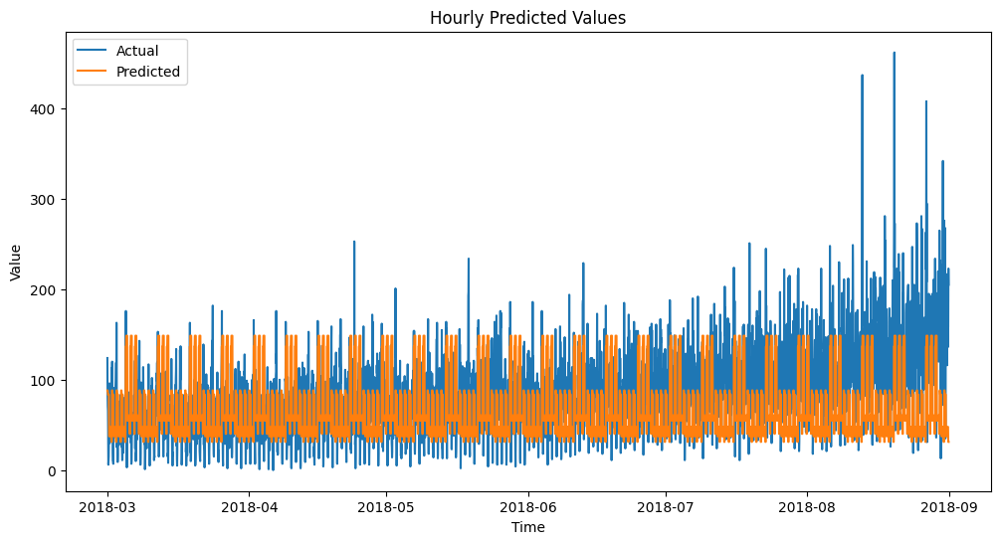

In [ ]:
# Plot using prediction value
plt.figure(figsize=(12, 6))
plt.plot(df_resampled.index, df_resampled['y'], label='Actual')
plt.plot(prediction_df['ds'], predicted_values, label='Predicted')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Hourly Predicted Values')
plt.legend()
plt.show()

In [ ]:
predicted_values

array([88.16993 , 88.16993 , 88.16993 , ..., 31.227947, 31.227947,
       31.227947], dtype=float32)

**Create a dataframe to predict the next 1 hour (Prophet)**

In [ ]:
# Create a dataframe to predict the next 1 hour
future2 = m.make_future_dataframe(periods=1,freq='H')

# Create a value predictions from data that has been generated
forecast2 = m.predict(future2)

In [ ]:
future2

,ds
0,2018-03-01 00:00:00
1,2018-03-01 00:10:00
2,2018-03-01 00:20:00
3,2018-03-01 00:30:00
4,2018-03-01 00:40:00
...,...
26392,2018-08-31 06:40:00
26393,2018-08-31 06:50:00
26394,2018-08-31 07:00:00
26395,2018-08-31 07:10:00


In [ ]:
forecast2

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2018-03-01 00:00:00,9.115567,6.631270,23.976636,9.115567,9.115567,6.210328,6.210328,6.210328,5.747990,5.747990,5.747990,0.462338,0.462338,0.462338,0.0,0.0,0.0,15.325895
1,2018-03-01 00:10:00,9.115786,6.143588,24.281786,9.115786,9.115786,6.278982,6.278982,6.278982,5.828886,5.828886,5.828886,0.450096,0.450096,0.450096,0.0,0.0,0.0,15.394768
2,2018-03-01 00:20:00,9.116006,6.843435,24.333754,9.116006,9.116006,6.336755,6.336755,6.336755,5.899095,5.899095,5.899095,0.437659,0.437659,0.437659,0.0,0.0,0.0,15.452761
3,2018-03-01 00:30:00,9.116226,6.666671,24.487601,9.116226,9.116226,6.385329,6.385329,6.385329,5.960293,5.960293,5.960293,0.425036,0.425036,0.425036,0.0,0.0,0.0,15.501555
4,2018-03-01 00:40:00,9.116445,7.066752,24.512098,9.116445,9.116445,6.425570,6.425570,6.425570,6.013338,6.013338,6.013338,0.412232,0.412232,0.412232,0.0,0.0,0.0,15.542015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26392,2018-08-31 06:40:00,24.860968,7.483736,24.882390,24.860968,24.860968,-8.560254,-8.560254,-8.560254,-9.356054,-9.356054,-9.356054,0.795800,0.795800,0.795800,0.0,0.0,0.0,16.300714
26393,2018-08-31 06:50:00,24.862506,8.460176,25.497622,24.862506,24.862506,-8.429518,-8.429518,-8.429518,-9.248793,-9.248793,-9.248793,0.819275,0.819275,0.819275,0.0,0.0,0.0,16.432988
26394,2018-08-31 07:00:00,24.864044,7.992232,25.491120,24.864044,24.864044,-8.180306,-8.180306,-8.180306,-9.023026,-9.023026,-9.023026,0.842720,0.842720,0.842720,0.0,0.0,0.0,16.683738
26395,2018-08-31 07:10:00,24.865583,8.138093,26.176181,24.865583,24.865583,-7.817511,-7.817511,-7.817511,-8.683637,-8.683637,-8.683637,0.866126,0.866126,0.866126,0.0,0.0,0.0,17.048071


In [ ]:
plot_plotly(m, forecast2)

In [ ]:
plot_components_plotly(m, forecast2)

**Conclusion**

At data training step using the Prophet model, we create a dataframe to predict 1 hour in the future by creating the `future2` variable. Then, we also create a value predictions from the data that has been generated using the `forecast2` variable. In `forecast2`, the prediction value is in the `yhat` column.

Then, we visualize using `plot_plotly` on the model that we have defined `m` and `forecast2` data. The blue lines are the predicted trend, and the black dots are the actual data.

Next, we create a trend, weekly, and daily plots using the prophet model. On a `weekly` basis, we can see that there is an upward trend on `Monday`, `Wednesday` and `Friday`. Then on the `daily` we see that there is an increase at `10.30`, `16.30` and `00.00`. This can be triggered by the hours of going to work, coming home from work, and curfews for relaxation (after hours) such as going to the mall, and so on.

In the XGBRegressor model, we also obtained a similar pattern

## **6. Test The Data**

**Predictive testing with data for the next 100 days**

In [ ]:
# Generate prediction data that is compared with test data
predictions = forecast.iloc[-100:]['yhat']

In [ ]:
error = rmse(test['y'], predictions)
mean_test = test['y'].mean()
proportion = round(error / mean_test * 100, 2)

print("Root Mean Squared Error between actual and predicted values: ", error)
print("Mean Value of Test Dataset:", mean_test)
print("Proportion of RMSE and Average Test Value: ", proportion, "%")

Root Mean Squared Error between actual and predicted values:  10.311008366254324
Mean Value of Test Dataset: 28.21
Proportion of RMSE and Average Test Value:  36.55 %


**Testing with predictions with data for the next 1 hour**

In [ ]:
# Generate prediction data that is compared with test data
predictions2 = forecast2.iloc[-100:]['yhat']

In [ ]:
error2 = rmse(test['y'], predictions2)
mean_test2 = test['y'].mean()
proportion2 = round(error2 / mean_test2 * 100, 2)

print("Root Mean Squared Error between actual and predicted values: ", error2)
print("Mean Value of Test Dataset:", mean_test2)
print("Proportion of RMSE and Average Test Value: ", proportion2, "%")

Root Mean Squared Error between actual and predicted values:  11.056481790134324
Mean Value of Test Dataset: 28.21
Proportion of RMSE and Average Test Value:  39.19 %


**Conclusion**

In the testing step for Prophet model, we use RMSE using statsmodels. We took the last 100 days of `yhat` (days that have `predicted` but there is no `actual`), then we compare them with the `real` data.

After we generate RMSE, we get the following results:

Root Mean Squared Error between actual and predicted values:  `11.056481790134324`

Mean Value of Test Dataset: `28.21`

The error rate (`RMSE`) reaches `39.19 %`, this val

**Testing with predictions with data for the next 1 hour using XGBRegressor**

In [ ]:
# Make predictions on the test set using the best model
predicted_values

array([88.16993 , 88.16993 , 88.16993 , ..., 31.227947, 31.227947,
       31.227947], dtype=float32)

In [ ]:
# Calculate mean squared error
mse = mean_squared_error(df_resampled['y'], predicted_values)
rmse2 = np.sqrt(mse)


In [ ]:
# Print the best parameter and root mean squared error
print("Best parameters:", best_params)
print("Root Mean Squared Error:", rmse2)


Best parameters: {'subsample': 0.8, 'n_estimators': 1000, 'min_child_weight': 3, 'max_depth': 5, 'learning_rate': 0.01, 'gamma': 0.2, 'colsample_bytree': 1.0}
Root Mean Squared Error: 62.00865659740173


**Conclusion**

In the testing step for the XGBRegressor model, we use the RMSE using the scikit learn metric. We took data for the next 1 hour from the dataset that has been provided. then we calculate the best parameters.

After we generate RMSE, we get the best results as follows:

Best parameters: `at max_depth` 5 , with `n_estimators` 1000

The error rate (`RMSE`) reaches `62.00 %`, this value is too high so it does not represent our objective which should not exceed `48%`

## **7. Final Conclusion**

In the preparation stage we get the `taxi.csv` dataset. Then we check the dataset `taxi.csv` it contains information about a taxi company called "Sweet Lift", this dataset has 2 columns and 26496 rows of data in it. In this case we make an analysis using several machine learning models to help a taxi company called "Sweet Lift" find solutions to the problems it faces. After we check the dataset that has been given, then we analyze the data, to further check the columns that we actually use for the machine learning model. This time we are using the Prophet model, therefore we need to change the `datetime` column to `ds`, and the `num_orders` column to `y`.

This is done to attract more drivers during peak hours, we need to predict the number of taxi orders for the next hour.

Next we make predictions with the Prophet model. Therefore we use several types of visualization patterns in model predictions namely `Trend`, `Seasonality`, and `Residuals`. After training the model and visualization, we get the best results on the `Daily` pattern visualization.

After we do a daily visualization, it can be seen that in the 'Trend' plot the pattern rises periodically starting from the **June 2018** period. However, it significantly increased in the **Aug 2018** period. This could possibly be caused by many things, such as certain events such as school holidays, or other events that caused an increase in the number of taxi orders at that time.

In the `Seasonality` plot, the graph is not very visible, because the movement is quite stable. However, on the 'Residuals' plot, we can see a sharp decline in Q1 **Mar 2018** which was preceded by a sharp increase on the previous day, this could possibly be due to a one time event that occurred at that time, such as concert or festival held the day before. Then in Q3 **Aug 2018** there was a sharp increase, this might have been caused by a certain event at that time, or it could have been due to natural factors such as autumn for example, because the temperature was starting to get a bit colder so people preferred to order. taxi instead of walking or using other transportation.

In the data training step using the Prophet model, we create a dataframe to predict 1 hour in the future by creating the `future2` variable. Then, we also make value predictions from the data that has been generated using the `forecast2` variable. In `forecast2` the prediction value is in the `yhat` column.

Then we visualize using `plot_plotly` on the model that we have defined `m` and `forecast2` data. The blue lines are the predicted trend, and the black dots are the actual data.

Next, we make trend, weekly, and daily plots using the prophet model. On a `weekly` basis, we can see that there is an upward trend on `Monday`, `Wednesday` and `Friday`. Then `daily` we see that there is an increase at `10.30`, `16.30` and `00.00`. This can be triggered by the hours of going to work, coming home from work, and curfews for relaxation (after hours) such as going to the mall, and so on.

In the testing step, we use RMSE using statsmodels. We take the last 100 days of `yhat` (days that have `predicted` but no `actual`), then we compare them with the `real` data.

After we generate RMSE, we get the following results:

Root Mean Squared Error between actual and predicted values: `11.056481790134324`

Mean Value of Test Dataset: `28.21`

The error rate (`RMSE`) reaches `39.19 %`, this value already represents our objective which should not exceed `48%`

However, XGBRegressor's model doesn't look very good, because the result is very far from our expectation. The RMSE value obtained for the XGBRegressor model is `62%`, and it also takes quite a long time to generate the model, around almost 1 hour. So based on the results it can be concluded that the Prophet is a good model for this case.

It can be concluded that overall test has been completed